# BONUS 1. Variational Autoencoder

https://towardsdatascience.com/intuitively-understanding-variational-autoencoders-1bfe67eb5daf

В этом бонусе предлагается научиться реализовывать Variational autoencoders. После этого с ним можно точно так же играться -- генерить новых людей (кстати, сравните с тем, как генерит обычный автоэнкодер -- кто круче и почему?) пририсовывать улыбки тем же самым способом, что и для обычного autoencoder. Вперед!

## Шаг 1
В этом ноутбуке мы будем тренировать автоэнкодеры кодировать лица людей. Для этого возьмем следующий датасет: "Labeled Faces in the Wild" (LFW) (http://vis-www.cs.umass.edu/lfw/). Вам нужно скачать оттуда lfw-deepfunneled.tgz и lfw_attributes.txt. Архив .tgz нужно распаковать =) После этого у вас появится папка с папками с лицами людей.

P.S. Не забудьте разбить выборку на train и test (нет, не в отдельные папки, а при загрузке в память компьютера в ноутбуке =))

P.P.S. для улучшения обучения автоэекодера полезно перевести величины пикселей картинки в отрезок [0, 1] (изначально они в интервале [0, 255]), а также привести их к типу float. Также удобно для начала сделать resize картинок в размер ~ (45, 45), чтобы обучить автоэнкодер было проще. Потом вы можете увеличить картинки как хотите, и усложнять вместе с ними автоэнкодер.

### Подготовка данных

Скачаем архив с картинками *lfw-deepfunneled.tgz*

In [0]:
!wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz

--2019-06-26 20:09:28--  http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz
Resolving vis-www.cs.umass.edu (vis-www.cs.umass.edu)... 128.119.244.95
Connecting to vis-www.cs.umass.edu (vis-www.cs.umass.edu)|128.119.244.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 108761145 (104M) [application/x-gzip]
Saving to: ‘lfw-deepfunneled.tgz’

lfw-deepfunneled.tg 100%[===================>] 103.72M  27.7MB/s    in 5.1s    

2019-06-26 20:09:34 (20.4 MB/s) - ‘lfw-deepfunneled.tgz’ saved [108761145/108761145]



Скачаем файл *lfw_attributes.txt*

In [0]:
!wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/lfw_attributes.txt #http://vis-www.cs.umass.edu/lfw/lfw_attributes.txt

--2019-06-26 20:09:39--  http://www.cs.columbia.edu/CAVE/databases/pubfig/download/lfw_attributes.txt
Resolving www.cs.columbia.edu (www.cs.columbia.edu)... 128.59.11.206
Connecting to www.cs.columbia.edu (www.cs.columbia.edu)|128.59.11.206|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14879205 (14M) [text/plain]
Saving to: ‘lfw_attributes.txt’

lfw_attributes.txt  100%[===================>]  14.19M  16.0MB/s    in 0.9s    

2019-06-26 20:09:40 (16.0 MB/s) - ‘lfw_attributes.txt’ saved [14879205/14879205]



Распакуем архив

In [0]:
!tar -xvzf lfw-deepfunneled.tgz

lfw-deepfunneled/AJ_Cook/AJ_Cook_0001.jpg
lfw-deepfunneled/AJ_Lamas/AJ_Lamas_0001.jpg
lfw-deepfunneled/Aaron_Eckhart/Aaron_Eckhart_0001.jpg
lfw-deepfunneled/Aaron_Guiel/Aaron_Guiel_0001.jpg
lfw-deepfunneled/Aaron_Patterson/Aaron_Patterson_0001.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0001.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0002.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0003.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0004.jpg
lfw-deepfunneled/Aaron_Pena/Aaron_Pena_0001.jpg
lfw-deepfunneled/Aaron_Sorkin/Aaron_Sorkin_0001.jpg
lfw-deepfunneled/Aaron_Sorkin/Aaron_Sorkin_0002.jpg
lfw-deepfunneled/Aaron_Tippin/Aaron_Tippin_0001.jpg
lfw-deepfunneled/Abba_Eban/Abba_Eban_0001.jpg
lfw-deepfunneled/Abbas_Kiarostami/Abbas_Kiarostami_0001.jpg
lfw-deepfunneled/Abdel_Aziz_Al-Hakim/Abdel_Aziz_Al-Hakim_0001.jpg
lfw-deepfunneled/Abdel_Madi_Shabneh/Abdel_Madi_Shabneh_0001.jpg
lfw-deepfunneled/Abdel_Nasser_Assidi/Abdel_Nasser_Assidi_0001.jpg
lfw-deepfunneled/Abdel_Nasser_

Будем работать с изображениями размера (64, 64, 3)



In [0]:
# Зададим желаемый размер изображений
img_rows, img_cols = 64, 64 # Окончательный размер (после кропа)
rows, cols = 172, 172 # Начальный размер (до кропа)
crop_dx, crop_dy = 54, 54 # Отступы по ширине и высоте для центрального кропа
# И размер батча
batch_size = 128
seed = 12

С помощью датагенератора соберем датасеты для обучения и для валидации

In [0]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import numpy as np

Using TensorFlow backend.


In [0]:
all_datagen  = ImageDataGenerator(
        # Приводим значения к отрезку [0, 1]
        rescale=1./255.,
        # Указываем коэффициент для разделения выборки на train и val
        validation_split=0.25
        )

train_generator_ = all_datagen.flow_from_directory(
        # Изображения берем из папки, в которую только что распаковали архив
        '/content/lfw-deepfunneled/',
        # Приводим к нужному размеру
        # target_size=(img_rows, img_cols), # было до 22.06.2019
        target_size=(rows, cols), # стало после 22.06.2019 (по расчету центральная часть размера 64 на 64 и будет лицом)
        # Задаем размер батча
        batch_size=batch_size,
        # Метки классов не нужны
        class_mode=None,
        # Перемешиваем
        shuffle=True,
        # Указываем, что берем только отобранные для обучения изображения
        subset='training',
        seed=seed
        )

val_generator_ = all_datagen.flow_from_directory(
        # Изображения берем из папки, в которую только что распаковали архив
        '/content/lfw-deepfunneled/',
        # Приводим к нужному размеру
        #target_size=(img_rows, img_cols), # было до 22.06.2019
        target_size=(rows, cols), # стало после 22.06.2019
        # Задаем размер батча
        batch_size=batch_size,
        # Метки классов не нужны
        class_mode=None,
        # Не перемешиваем
        shuffle=False,
        # Указываем, что берем только отобранные для валидации изображения
        subset='validation',
        seed=seed
        )

Found 11705 images belonging to 5749 classes.
Found 1528 images belonging to 5749 classes.


Так как нужна только центральная часть изображений (лицо), делаем новый генератор с центральным кропом





In [0]:
def crop_generator(batches, crop_length=(54, 54)):
  while 1:
    batch_x = batches.next()
    dx, dy = crop_length
    batch_x = batch_x[:,dx:-dx,dy:-dy]    
    yield (batch_x)

In [0]:
train_generator = crop_generator(train_generator_, crop_length=(crop_dx, crop_dy))
val_generator = crop_generator(val_generator_, crop_length=(crop_dx, crop_dy))

Проверим размеры одного батча

In [0]:
x = next(train_generator)

In [0]:
x.shape

(128, 64, 64, 3)

Выведем несколько изображений

In [0]:
import matplotlib.pyplot as plt

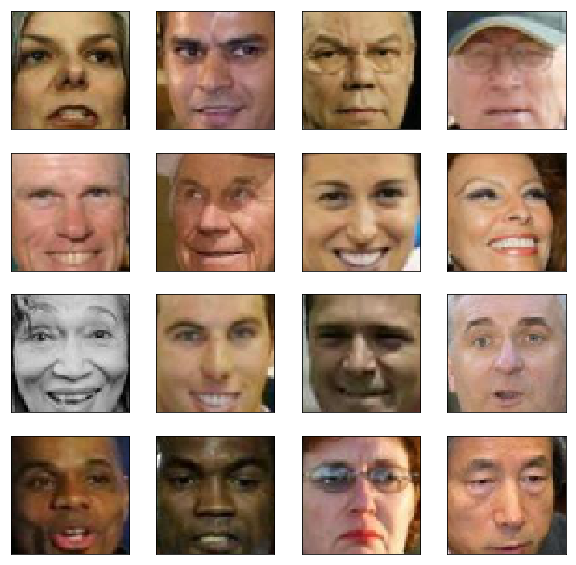

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x[i])

Данные готовы!

## Шаг 2

### Построение модели

В отличие от обычных автоэнкодеров с непредсказуемым латентным пространством вариационные автоэнкодеры имеют заданное латентное пространство, из которого умеют хорошо сэмплить. В качестве такого пространства берут пространство с нормальным распределением.

Таким образом латентный вектор в вариационном автоэнкодере представляет собой уже не набор конкретных значений признаков, которые выделил энкодер, а распределение вероятностей (диапазон значений) по каждому признаку.

Т.е. энкодер будет выдавать два вектора, описывающих параметры распределения случайной величины (среднее и дисперсию). Но мы не может просто взять случайную величину с полученными параметрами. Чтобы иметь возможность использовать метод обратного распространения ошибки применим репараметризацию:

![sample](https://hsto.org/web/a4e/ec5/3a3/a4eec53a3cf24b289e494e4f03f71a39.png)

Просто берем предсказанную энкодером дисперсию умножаем на случайное число из $N(0,1)$ и добавляем предсказанное среднее. Полученный вектор отправляем дальше декодеру.

Чтобы избежать отрицательных значений для дисперсии, будем использовать вместо нее логарифм:
$\Sigma$ ~ $\log\Sigma=\log\sigma^2$

Функция потерь для такой сети будет состоять из двух компонентов:

1.   Первый будет следить за качеством реконструкции (как было в обычном автоэнкодере)
2.   А второй будет следить за близостью латентного вектора к нормальному распределению $N(0, 1)$, используем для этого расстояние Кульбака-Лейблера:

>$KL = - 0.5 * \Sigma (1 + \log\sigma^2 - \sigma^2 - \mu^2)$







In [0]:
# Подключим необходимые модули
from __future__ import print_function, division

from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Add, Multiply, Lambda, Layer
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, Conv2DTranspose, GlobalAveragePooling2D, ReLU
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.losses import mse, binary_crossentropy
from keras import backend as K
import sys

In [0]:
# Папка для сохранения (если нужно) изображений с реконструкциями во время обучения
!mkdir images

In [0]:
# Тестовый батч для отслеживания качества реконструкции во время обучения
x_test = next(val_generator)

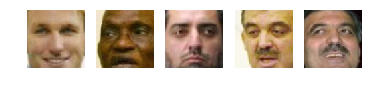

In [0]:
# Возьмем только 5 изображений, чтобы не захламлять вывод
r, c = 1, 5
fig, axs = plt.subplots(r, c)
for j in range(c):
  axs[j].imshow(x_test[j]) 
  axs[j].axis('off')
plt.show()

In [0]:
dim0 = img_rows * img_cols * 3
dim1 = 6144 
dim2 = 4096 
dim3 = 2048 
latent_dim = 768

In [0]:
# Определим класс для автоэнкодера
class VAE():
    def __init__(self):

        # Укажем размер картинок на входе и выходе
        self.img_rows = img_rows  
        self.img_cols = img_cols  
        self.channels = 3 
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        # И длину латентного вектора
        self.latent_dim = latent_dim

        # Строим энкодер
        input_img = Input(shape=self.img_shape)
        conv_1_1 = Conv2D(filters=128, kernel_size=5, strides=(2, 2), activation='relu', padding='same')(input_img)
        conv_1_2 = Conv2D(filters=128, kernel_size=4, strides=(2, 2), activation='relu', padding='same')(conv_1_1)
        conv_1_3 = Conv2D(filters=16, kernel_size=3, strides=(1, 1), activation='relu', padding='same')(conv_1_2)
        fl = Flatten()(conv_1_3)
        fc1 = Dense(dim3, activation='relu')(fl)
        # Среднее
        z_mean = Dense(self.latent_dim, name='z_mean')(fc1)
        # Логарифм дисперсии
        z_log_var = Dense(self.latent_dim, name='z_log_var')(fc1)
        def sampler(args):
          mean, log_stddev = args
          # Берем случайную величину из N(0,1)
          std_norm = K.random_normal(shape=(K.shape(mean)[0], self.latent_dim), mean=0., stddev=1.)
          # Выполняем репараметризацию: μ + σX, X~N(0,1)
          return mean + K.exp(log_stddev) * std_norm 
        z = Lambda(sampler)([z_mean, z_log_var])
        self.encoder = Model(input_img, z)  
        self.encoder.summary()

        # Строим декодер
        latent_code = Input(shape=(self.latent_dim,))
        fc2_1 = Dense(dim3, activation='relu')(latent_code)
        fc2_2 = Dense(dim2, activation='relu')(fc2_1)
        resh = Reshape((16, 16, -1))(fc2_2)
        conv_2_1 = Conv2DTranspose(filters=128, kernel_size=3, activation='relu', strides=2, padding='same')(resh)
        conv_2_2 = Conv2DTranspose(filters=128, kernel_size=4, activation='relu', strides=1, padding='same')(conv_2_1)
        conv_2_3 = Conv2DTranspose(filters=128, kernel_size=4, activation='relu', strides=2, padding='same')(conv_2_2)
        output = Conv2DTranspose(filters=3, kernel_size=5, activation='sigmoid', padding='same')(conv_2_3)
        self.decoder = Model(latent_code, output) 
        self.decoder.summary()
        
        # Строим автоэнкодер
        self.autoencoder = Model(input_img, self.decoder(self.encoder(input_img)))
        
        # Определим функцию потерь
        def vae_loss(input_img, output_img):
          # Считаем потери при реконструкции (берем кросс-энтропию)
          reconstruction_loss = binary_crossentropy(K.reshape(input_img, (-1, dim0)), K.reshape(output_img, (-1, dim0)))
          # Но по каждому батчу мы хотим получить сумму, а не среднее
          # Поэтому домножаем на количество элементов в батче
          reconstruction_loss *= dim0
          # Считаем расстояние Кульбака-Лейблера
          kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
          kl_loss = K.sum(kl_loss, axis=-1)
          kl_loss *= -0.5
          # Берем среднее
          vae_loss = K.mean(reconstruction_loss + kl_loss)
          return vae_loss 

        opt = Adam(0.0001)
        self.autoencoder.compile(optimizer=opt, loss=vae_loss)
        self.autoencoder.summary()

    def train(self, epochs, save_imgs=False, sample_interval=100):

        train_losses = []
        val_losses = []

        for epoch in range(epochs):

            # Получаем батч картинок для обучения с помощью генератора
            imgs = next(train_generator)

            # Обучаем автоэнкодер (желаемый выход = вход) и запоминаем лосс
            d_loss = self.autoencoder.train_on_batch(imgs, imgs)
            train_losses.append(d_loss)

            # Получаем батч картинок для валидации с помощью генератора
            val_imgs = next(val_generator)
            
            # Считаем и запоминаем лосс
            g_loss = self.autoencoder.test_on_batch(val_imgs, val_imgs)
            val_losses.append(g_loss)

            # Если номер эпохи кратен sample_interval => 
            if epoch % sample_interval == 0:
                # Выводим лосс
                print ("%d [Train loss: %f] [Val loss: %f]" % (epoch, d_loss, g_loss))
                # Смотрим на получающиеся реконструкции 
                self.sample_images(epoch, save_imgs)
                
        return train_losses, val_losses

    def sample_images(self, epoch, save_imgs):
        # Получаем реконструкции для тестового батча
        y = self.autoencoder.predict(x_test[:5])
        # Выводим
        r, c = 2, 5
        fig, axs = plt.subplots(r, c)
        for j in range(c):
            axs[0, j].imshow(x_test[j]) 
            axs[0, j].axis('off')
            axs[1, j].imshow(y[j]) 
            axs[1, j].axis('off')
        plt.show()
        # При необходимости сохраняем в папку
        if save_imgs:
          fig.savefig("images/%d.png" % epoch)
          plt.close()


In [0]:
vae = VAE()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 64, 64, 3)    0                                            
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 32, 32, 128)  9728        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 16, 16, 128)  262272      conv2d_4[0][0]                   
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 16, 16, 16)   18448       conv2d_5[0][0]                   
__________________________________________________________________________________________________
flatten_2 

### Обучение автоэнкодера

0 [Train loss: 8514.138672] [Val loss: 8498.860352]


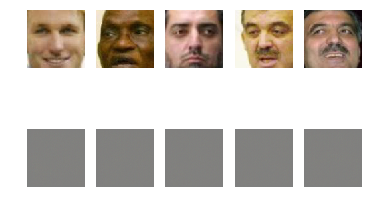

100 [Train loss: 8033.692871] [Val loss: 8004.180176]


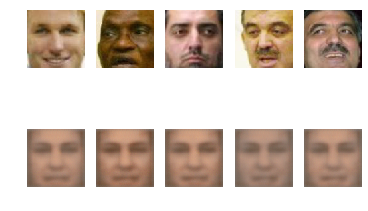

200 [Train loss: 7746.679199] [Val loss: 7704.942383]


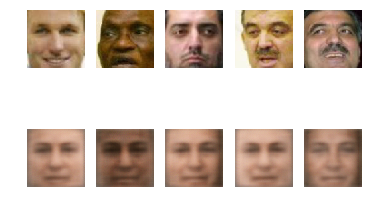

300 [Train loss: 7660.476074] [Val loss: 7729.533203]


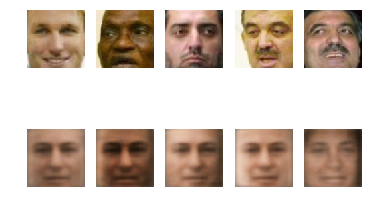

400 [Train loss: 7730.918457] [Val loss: 7648.028320]


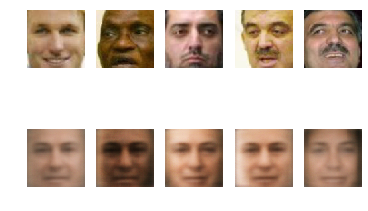

500 [Train loss: 7664.589355] [Val loss: 7565.298340]


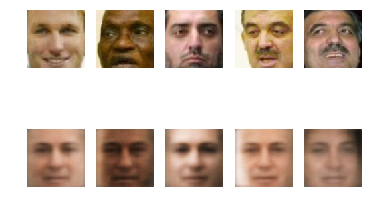

600 [Train loss: 7652.663086] [Val loss: 7607.575195]


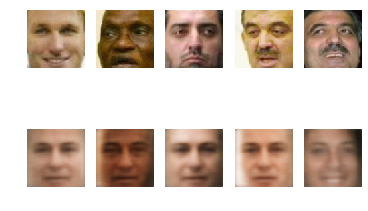

700 [Train loss: 7588.870605] [Val loss: 7589.850098]


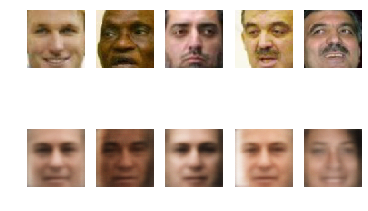

800 [Train loss: 7582.701172] [Val loss: 7525.019043]


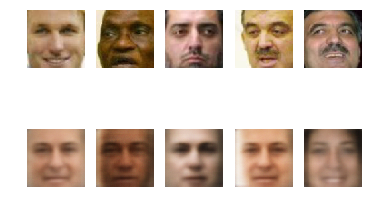

900 [Train loss: 7659.898926] [Val loss: 7579.823242]


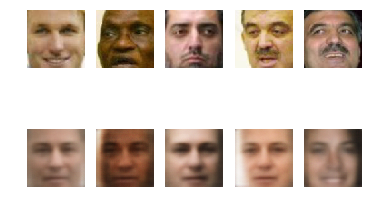

1000 [Train loss: 7604.423340] [Val loss: 7573.750000]


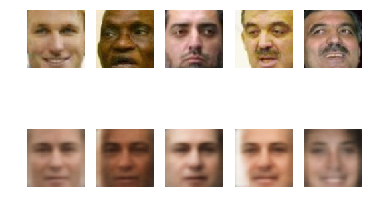

1100 [Train loss: 7565.519043] [Val loss: 7493.594727]


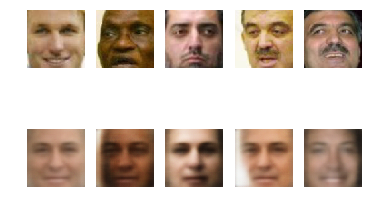

1200 [Train loss: 7574.625488] [Val loss: 7566.217773]


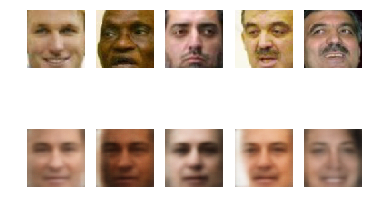

1300 [Train loss: 7585.931152] [Val loss: 7547.684570]


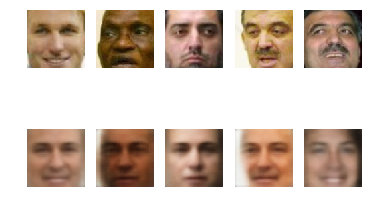

1400 [Train loss: 7593.436523] [Val loss: 7475.796387]


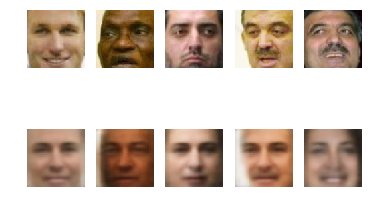

1500 [Train loss: 7602.128906] [Val loss: 7538.278320]


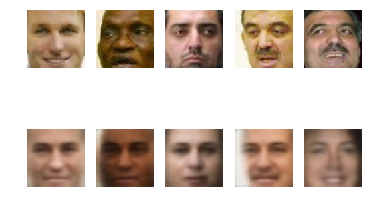

1600 [Train loss: 7506.600098] [Val loss: 7528.342773]


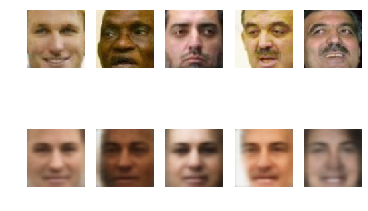

1700 [Train loss: 7533.096680] [Val loss: 7459.367188]


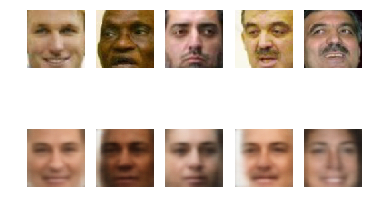

1800 [Train loss: 7570.390137] [Val loss: 7521.273438]


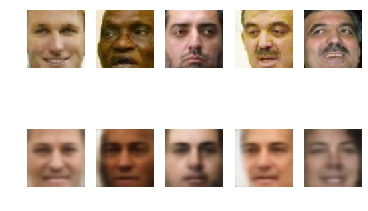

1900 [Train loss: 7554.588867] [Val loss: 7520.448730]


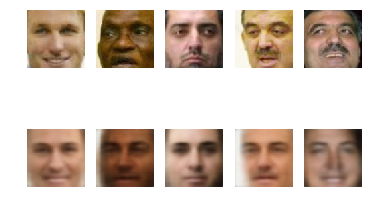

2000 [Train loss: 7532.556152] [Val loss: 7449.276367]


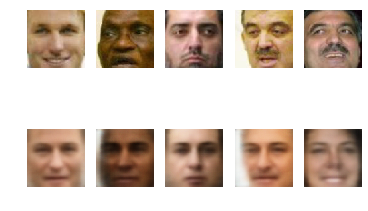

2100 [Train loss: 7507.117188] [Val loss: 7510.375977]


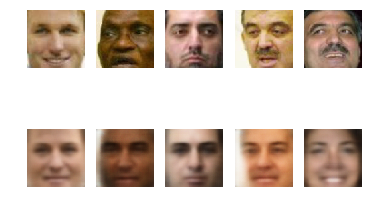

2200 [Train loss: 7503.669922] [Val loss: 7510.717773]


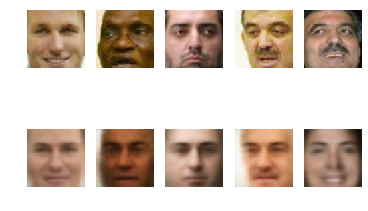

2300 [Train loss: 7519.366211] [Val loss: 7438.730957]


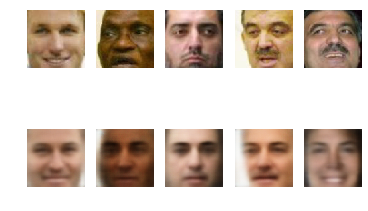

2400 [Train loss: 7509.240234] [Val loss: 7502.635254]


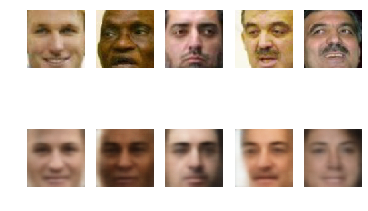

2500 [Train loss: 7524.034668] [Val loss: 7497.939941]


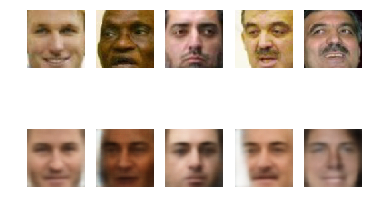

2600 [Train loss: 7534.868652] [Val loss: 7443.672852]


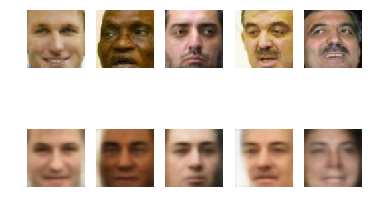

2700 [Train loss: 7547.868164] [Val loss: 7493.978516]


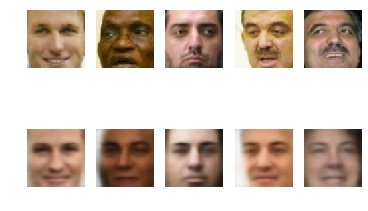

2800 [Train loss: 7414.626465] [Val loss: 7488.089844]


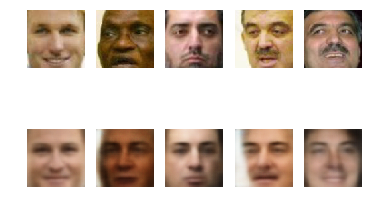

2900 [Train loss: 7549.604492] [Val loss: 7425.273926]


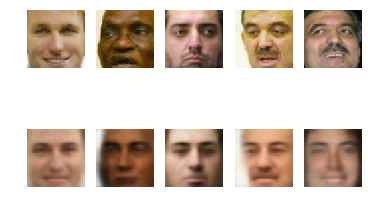

3000 [Train loss: 7534.472656] [Val loss: 7484.077148]


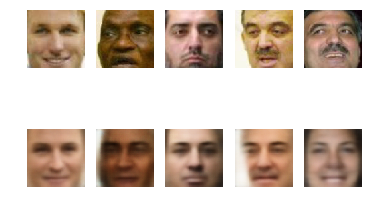

3100 [Train loss: 7479.172852] [Val loss: 7486.184570]


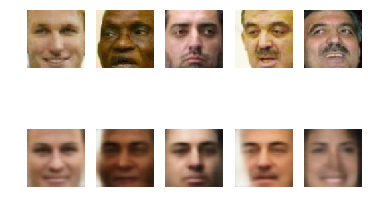

3200 [Train loss: 7532.443359] [Val loss: 7419.036621]


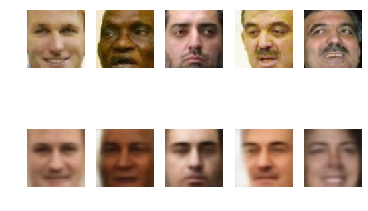

3300 [Train loss: 7472.971191] [Val loss: 7477.216309]


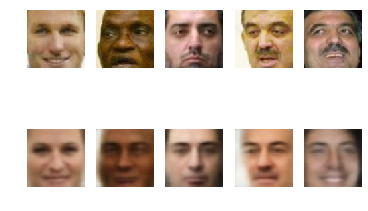

3400 [Train loss: 7429.984375] [Val loss: 7477.851074]


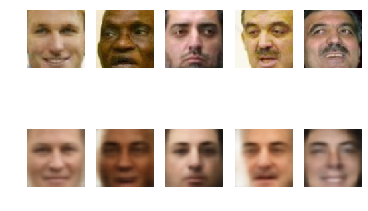

3500 [Train loss: 7503.815430] [Val loss: 7411.723145]


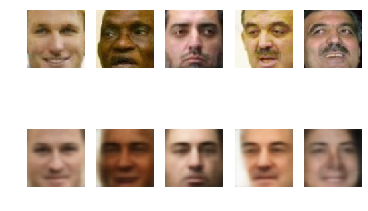

3600 [Train loss: 7557.271973] [Val loss: 7471.077148]


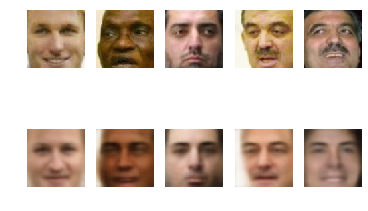

3700 [Train loss: 7552.631348] [Val loss: 7489.839844]


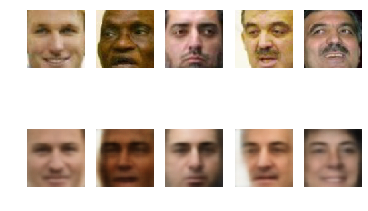

3800 [Train loss: 7515.021484] [Val loss: 7407.045410]


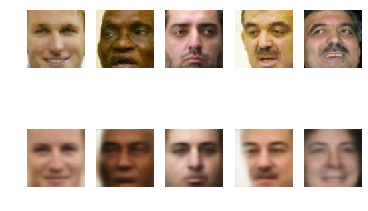

3900 [Train loss: 7495.179688] [Val loss: 7468.716797]


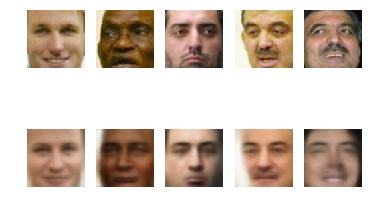

4000 [Train loss: 7504.194336] [Val loss: 7464.066406]


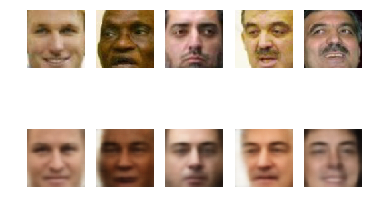

4100 [Train loss: 7489.001465] [Val loss: 7401.291016]


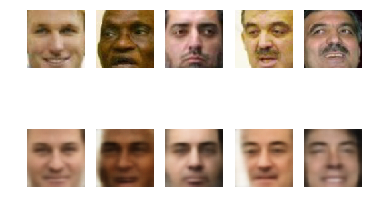

4200 [Train loss: 7466.147461] [Val loss: 7461.350586]


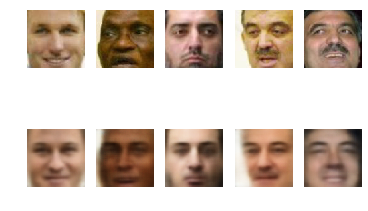

4300 [Train loss: 7483.380859] [Val loss: 7461.042969]


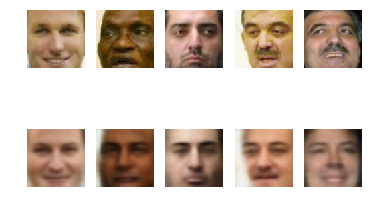

4400 [Train loss: 7479.054688] [Val loss: 7397.877930]


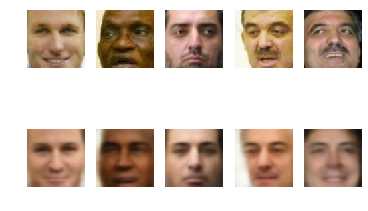

4500 [Train loss: 7469.929199] [Val loss: 7459.882812]


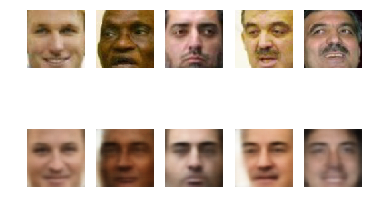

4600 [Train loss: 7411.147949] [Val loss: 7456.510742]


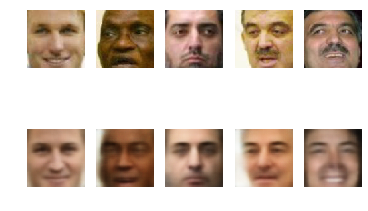

4700 [Train loss: 7474.719727] [Val loss: 7393.885742]


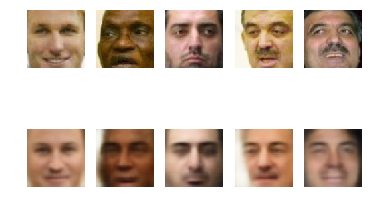

4800 [Train loss: 7494.007812] [Val loss: 7454.473145]


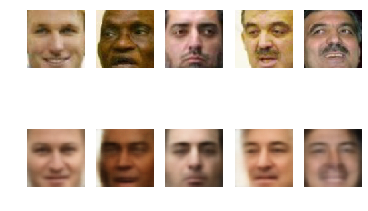

4900 [Train loss: 7473.362305] [Val loss: 7456.031250]


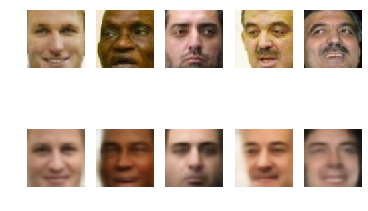

5000 [Train loss: 7477.771484] [Val loss: 7389.721680]


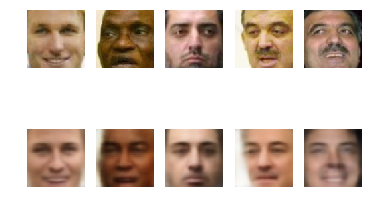

5100 [Train loss: 7511.708984] [Val loss: 7452.333008]


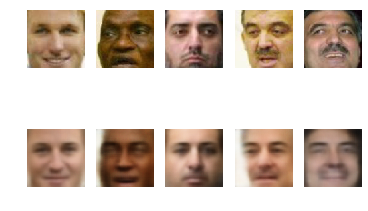

5200 [Train loss: 7447.734863] [Val loss: 7454.667969]


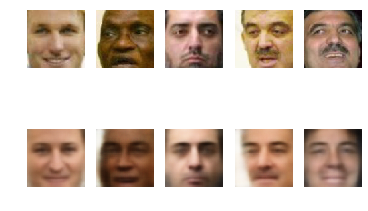

5300 [Train loss: 7456.817871] [Val loss: 7388.887695]


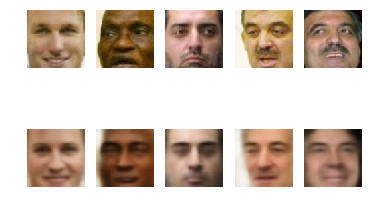

5400 [Train loss: 7478.935547] [Val loss: 7447.367188]


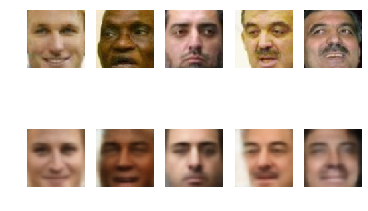

5500 [Train loss: 7422.691406] [Val loss: 7446.928711]


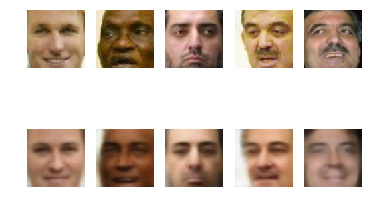

5600 [Train loss: 7413.787109] [Val loss: 7383.206055]


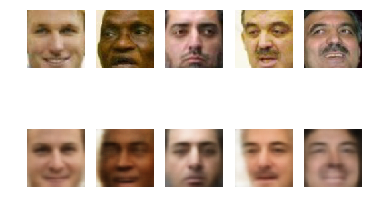

5700 [Train loss: 7453.258301] [Val loss: 7443.609863]


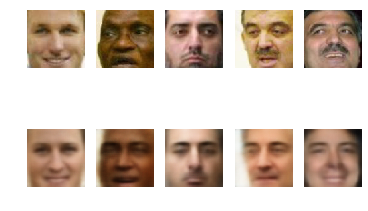

5800 [Train loss: 7485.055664] [Val loss: 7443.736328]


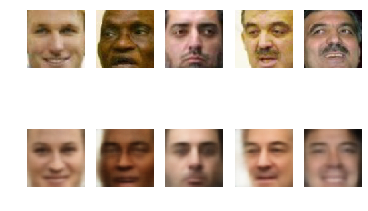

5900 [Train loss: 7462.194824] [Val loss: 7381.036133]


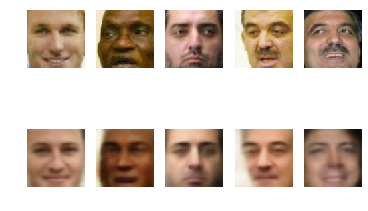

6000 [Train loss: 7465.994141] [Val loss: 7442.191406]


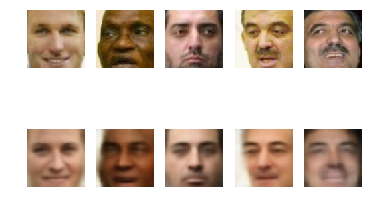

6100 [Train loss: 7448.052734] [Val loss: 7440.239258]


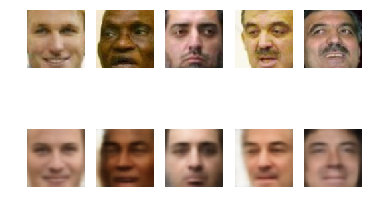

6200 [Train loss: 7445.313965] [Val loss: 7379.610352]


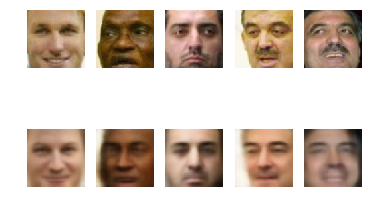

6300 [Train loss: 7497.492676] [Val loss: 7440.017578]


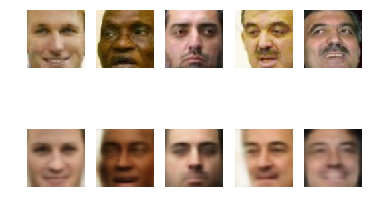

6400 [Train loss: 7458.935547] [Val loss: 7439.285156]


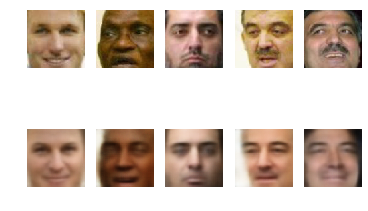

6500 [Train loss: 7424.708496] [Val loss: 7381.069336]


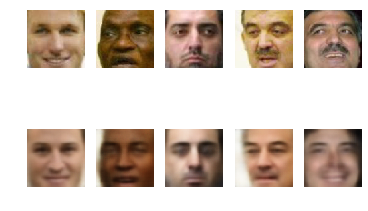

6600 [Train loss: 7478.416992] [Val loss: 7436.630371]


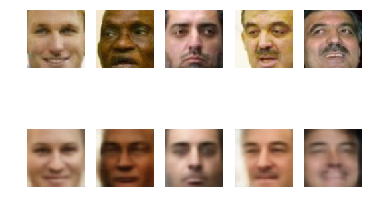

6700 [Train loss: 7474.571777] [Val loss: 7438.031250]


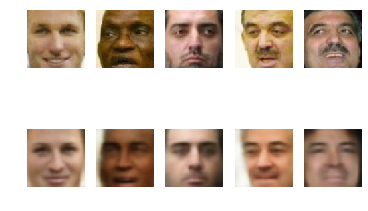

6800 [Train loss: 7478.734375] [Val loss: 7374.725586]


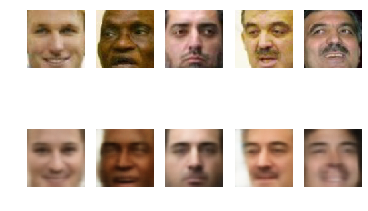

6900 [Train loss: 7452.332031] [Val loss: 7439.670898]


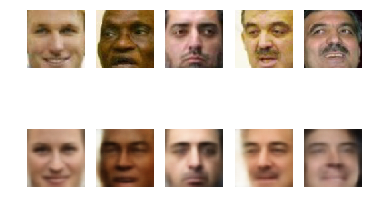

7000 [Train loss: 7439.281250] [Val loss: 7435.157227]


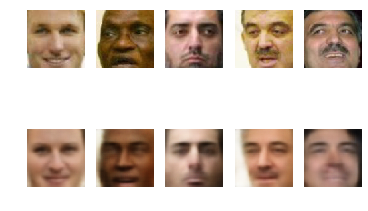

7100 [Train loss: 7470.143555] [Val loss: 7378.009766]


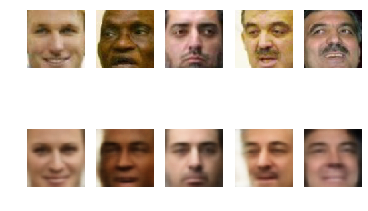

7200 [Train loss: 7515.807129] [Val loss: 7432.525391]


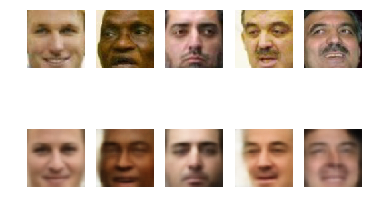

7300 [Train loss: 7449.853516] [Val loss: 7435.596680]


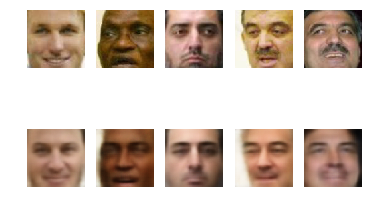

7400 [Train loss: 7449.770996] [Val loss: 7371.345703]


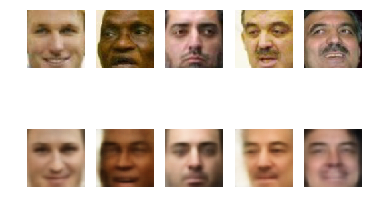

7500 [Train loss: 7400.675781] [Val loss: 7434.984375]


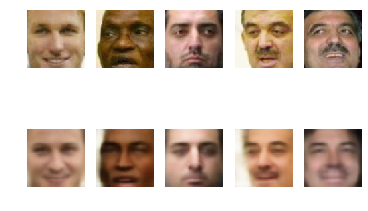

7600 [Train loss: 7422.202148] [Val loss: 7431.597656]


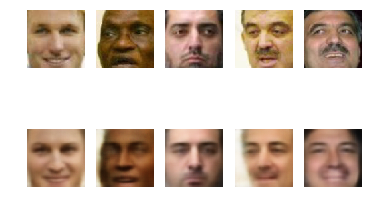

7700 [Train loss: 7486.933594] [Val loss: 7368.173340]


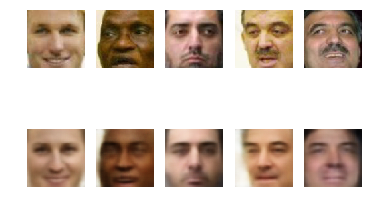

7800 [Train loss: 7477.685547] [Val loss: 7428.930176]


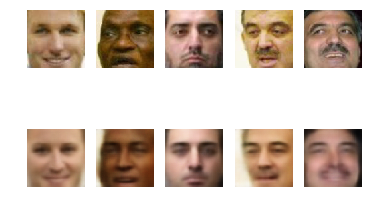

7900 [Train loss: 7426.110840] [Val loss: 7434.346680]


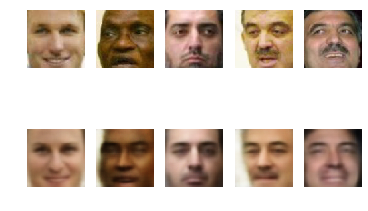

8000 [Train loss: 7472.323730] [Val loss: 7369.100098]


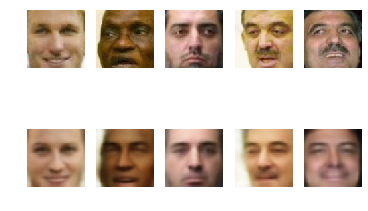

8100 [Train loss: 7449.198242] [Val loss: 7427.065430]


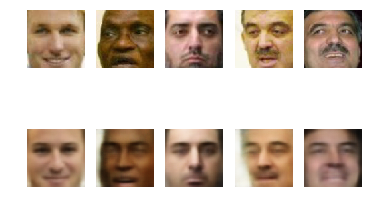

8200 [Train loss: 7384.193359] [Val loss: 7437.166992]


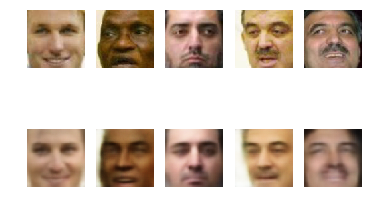

8300 [Train loss: 7460.379883] [Val loss: 7363.284180]


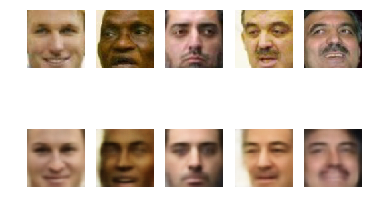

8400 [Train loss: 7441.496582] [Val loss: 7423.942871]


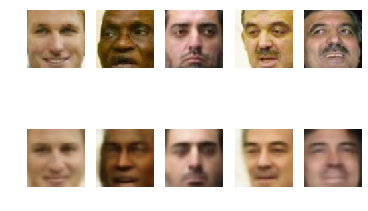

8500 [Train loss: 7450.152344] [Val loss: 7425.048828]


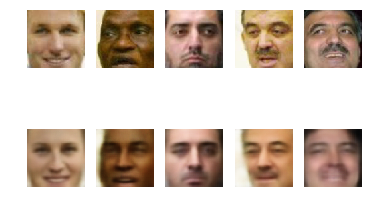

8600 [Train loss: 7383.916016] [Val loss: 7362.863281]


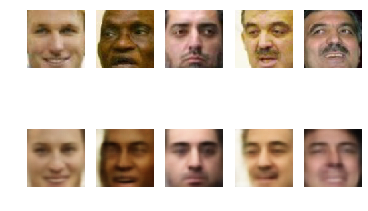

8700 [Train loss: 7453.880371] [Val loss: 7425.883789]


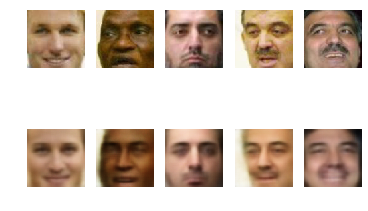

8800 [Train loss: 7439.335449] [Val loss: 7424.667969]


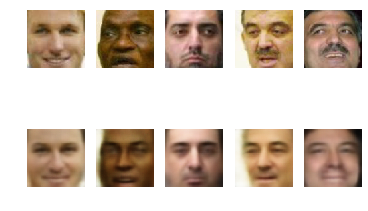

8900 [Train loss: 7466.668945] [Val loss: 7364.327148]


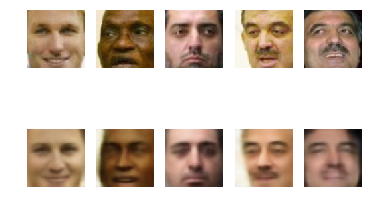

9000 [Train loss: 7468.858398] [Val loss: 7425.304688]


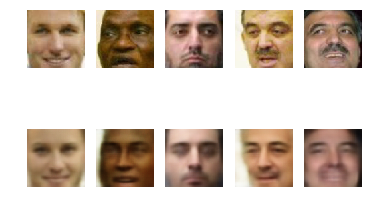

9100 [Train loss: 7464.059570] [Val loss: 7423.757812]


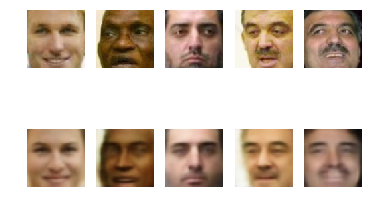

9200 [Train loss: 7496.146973] [Val loss: 7361.474609]


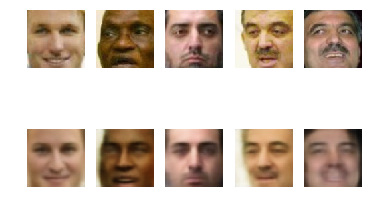

9300 [Train loss: 7429.307129] [Val loss: 7421.398926]


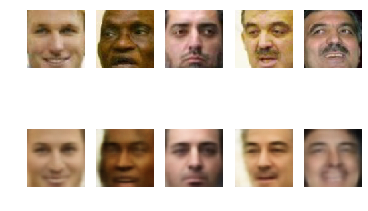

9400 [Train loss: 7441.242188] [Val loss: 7422.355469]


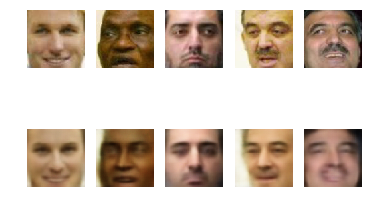

9500 [Train loss: 7412.489258] [Val loss: 7358.810547]


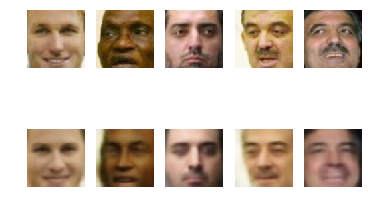

9600 [Train loss: 7446.988770] [Val loss: 7418.955078]


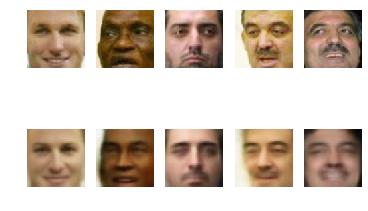

9700 [Train loss: 7404.798828] [Val loss: 7422.610352]


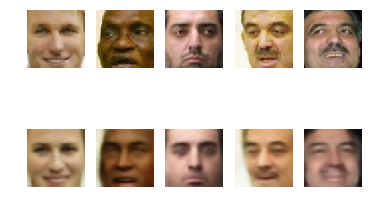

9800 [Train loss: 7394.333008] [Val loss: 7358.169922]


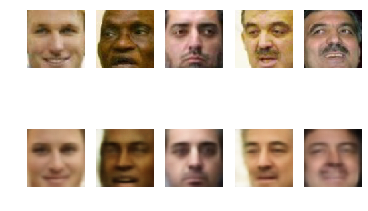

9900 [Train loss: 7412.421875] [Val loss: 7419.630859]


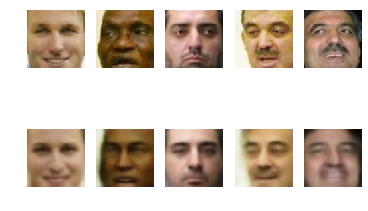

CPU times: user 1h 17min 41s, sys: 16min 45s, total: 1h 34min 27s
Wall time: 1h 42min 11s


In [0]:
%%time
t_loss, v_loss = vae.train(epochs=10000, save_imgs=True, sample_interval=100)

При желании можно собрать из сохраненных реконструкций (если они есть) gif

In [0]:
import os
import time
import glob
import PIL
import imageio

In [0]:
anim_file = 'vae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('/content/images/*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    image = imageio.imread(filename)
    writer.append_data(image)



Построим график функции потерь

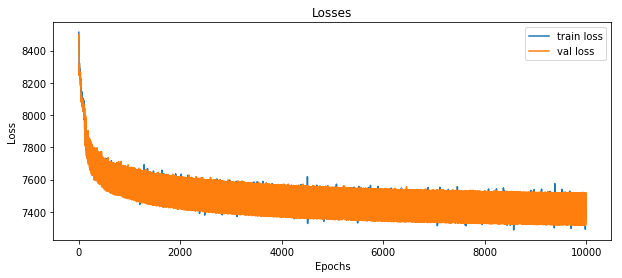

In [0]:
plt.figure(figsize=(10, 4))
plt.title("Losses")
plt.plot(t_loss, label="train loss")
plt.plot(v_loss, label="val loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend();

Сохраним обученную сеть

In [0]:
# Монтируем Google диск
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
# vae.autoencoder.save('/content/gdrive/My Drive/Project DLSw3/Variational Autoencoder/var_autoencoder.h5')

In [0]:
vae.autoencoder.save_weights('/content/gdrive/My Drive/Project DLSw3/Variational Autoencoder/var_autoencoder_weights.h5')

Загрузим веса ранее обученного автоэнкодера (для теста)

In [0]:
# vae.autoencoder.load_weights('/content/gdrive/My Drive/Project DLSw3/Variational Autoencoder/var_autoencoder_weights.h5')

## Шаг 3

Если вы смогли подобрать параметры сети и обучить ее, то пора начать играться =)

Играться можно так:

### Идея 1

Бывает очень интересно посмотреть на латентное пространство, которое получается у вашего автоэнкодера. На его структуру. Это можно сделать, воспользовавшись методами понижения размерности PCA и TSNE. Конкретнее:

1. Берете ваши картинки, прогоняет через encoder, получаете кучу латентных векторов некоторой размерности

2. На эти векторы глазами вы посмотреть не можете, потому что они более чем трехмерные. Поэтому нужно сжать их до размерности 2. Этим занимаются TSNE и PCA. Они есть в sklearn. Сжимаете ими векторы до размерности 2

3. Рисуете с помощью matplotlib картинку, где по оси Х первая из размерностей сжатого вектора, по оси У -- вторая

4. Примерно понимаете, как выглядит ваше скрытое пространство : ) оно будет ооочень разным для обычного AE и VAE

In [0]:
from sklearn.manifold import TSNE

Получаем кучу латентных векторов из валидационной выборки




In [0]:
x_lat_vae = vae.encoder.predict_generator(val_generator, steps=12)

In [0]:
x_lat_vae.shape

(1528, 768)

Понижаем размерность

In [0]:
x_embedded_vae = TSNE(n_components=2).fit_transform(x_lat_vae)

In [0]:
x_embedded_vae.shape

(1528, 2)

Рисуем и смотрим

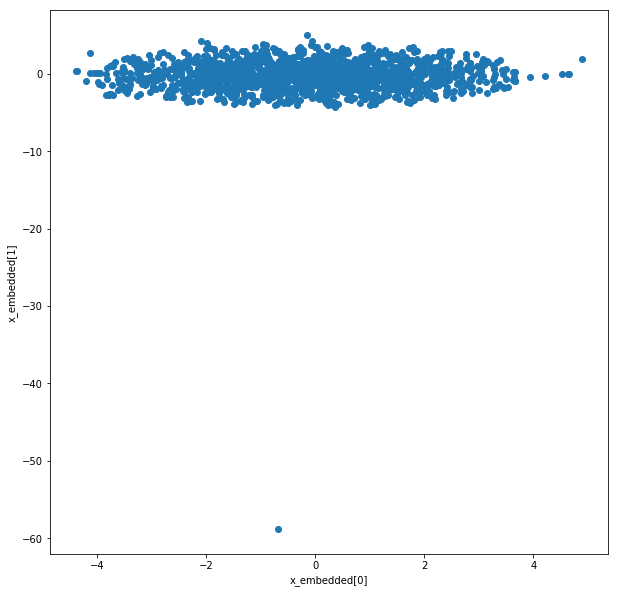

In [0]:
plt.figure(figsize=(10, 10))
plt.scatter(x_embedded_vae[:, 0], x_embedded_vae[:, 1])
plt.xlabel("x_embedded[0]")
plt.ylabel("x_embedded[1]")
plt.savefig('vae_val_lat.png')
plt.show()

Получаем кучу латентных векторов из обучающей выборки




In [0]:
x_lat_vae = vae.encoder.predict_generator(train_generator, steps=92)

In [0]:
x_lat_vae.shape

(11705, 768)

Понижаем размерность

In [0]:
x_embedded_vae = TSNE(n_components=2).fit_transform(x_lat_vae)

In [0]:
x_embedded_vae.shape

(11705, 2)

Рисуем и смотрим

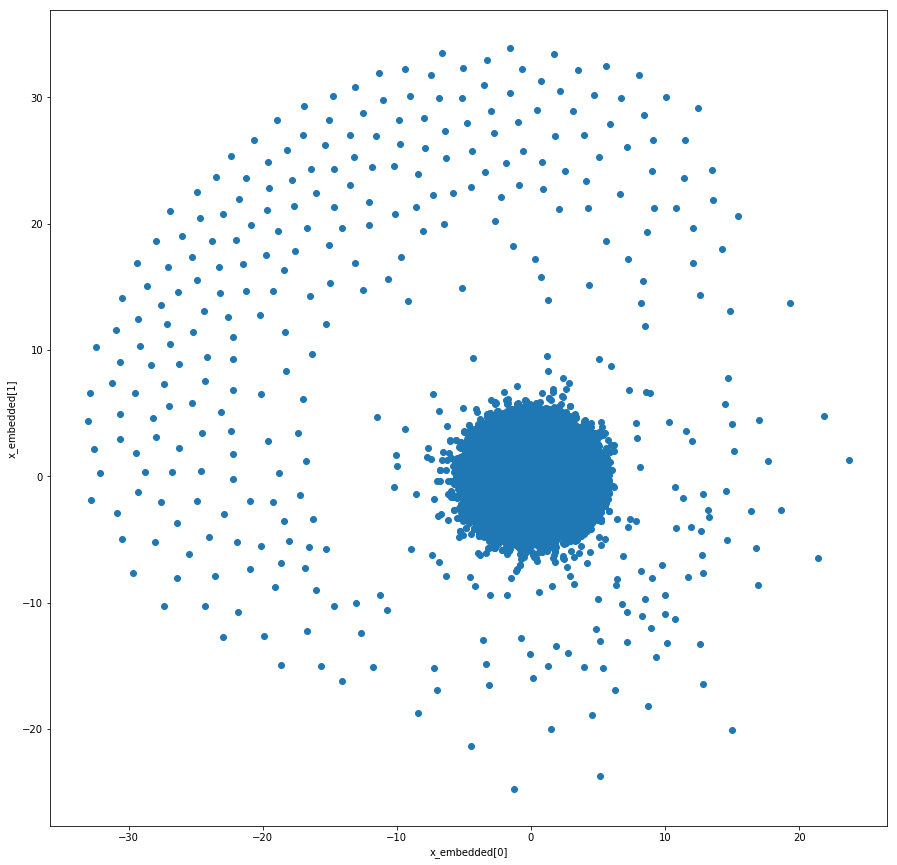

In [0]:
plt.figure(figsize=(15, 15))
plt.scatter(x_embedded_vae[:, 0], x_embedded_vae[:, 1])
plt.xlabel("x_embedded[0]")
plt.ylabel("x_embedded[1]")
plt.savefig('vae_train_lat.png')
plt.show()

Точки образуют плотный круг вокруг начала координат (0, 0) радиусом около 5. Правда в нашем случае часть точек не успела в него попасть (как будто точки по спирали наматывали на начало координат и последний виток остался размотанным). 

Теперь можно спокойно брать любую точку из круга и пробовать генерировать лица людей) 



### Идея 3

Смотрите, ваш AE научился на реальных фотках людей и ожидает на вход реальные фотки. А что если подать ему фотку человека с, например, замазанным ртом?) Берете и вместо рта пихаете черный квадрат. Что сделает AE?

P.S. если пихнуть квартат чуть выше рта, получите одного известного персонажа

Создаем батч из измененных изображений

In [0]:
arn_batch = []
for i in range(5):
  img = load_img('/content/gdrive/My Drive/Project DLSw3/Autoencoder/Arnold/Arnold_Schwarzenegger_0012_{}.jpg'.format(i), target_size=(rows, cols))
  x = img_to_array(img) / 255.
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  arn_batch.append(x)

In [0]:
arn_batch = np.array(arn_batch)
arn_batch.shape

(5, 64, 64, 3)

Пропустим через автоэнкодер

In [0]:
arn_dec = vae.autoencoder.predict(arn_batch)

Посмотрим на результат

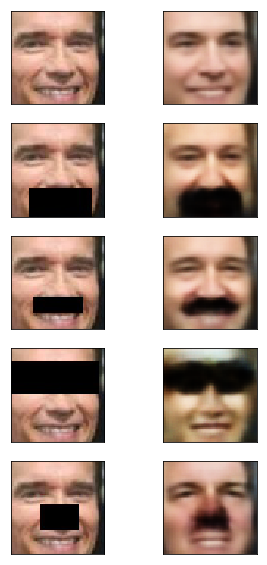

In [0]:
n=5
plt.figure(figsize=(5, 10))
for i in range(n):
  plt.subplot(n,2,2*i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(arn_batch[i])
  plt.subplot(n,2,2*i+2)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(arn_dec[i])


Черный прямоугольник на глазах vae пытается переделать в темные очки, а под носом в усы (если прямоугольник закрывал рот, то в очень густые усы, переходящие в бороду)

### Идея 4

Вот есть два разных человека. Например, Путин и Ким Чен Ын. Для них есть два латентных вектора. Что будет, если начать с одного вектора и начать от него двигаться ко второму?) 
Сравните, что получится для AE и VAE и в купе 1 пунктом (там, где надо смотреть на латентные векторы), ответьте на вопрос, почему результаты для AE и VAE такие разные

Возьмем два разных изображения

(64, 64, 3)


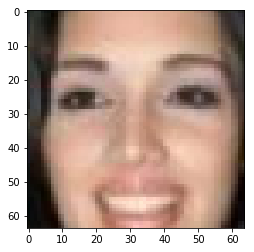

In [0]:
x1 = x_test[46]
print(x1.shape)
plt.imshow(x1)

In [0]:
np.expand_dims(x1, 0).shape

(1, 64, 64, 3)

In [0]:
y1 = vae.encoder.predict(np.expand_dims(x1, 0))

In [0]:
y1.shape

(1, 768)

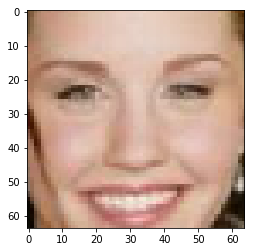

In [0]:
x2 = x_test[45]
plt.imshow(x2)

In [0]:
np.expand_dims(x2, 0).shape

(1, 64, 64, 3)

In [0]:
y2 = vae.encoder.predict(np.expand_dims(x2, 0))

In [0]:
y2.shape

(1, 768)

In [0]:
n = 25

z = [0 for i in range(vae.latent_dim)]
for i in range(vae.latent_dim):
  z[i] = np.linspace(y1[0][i], y2[0][i], n)

In [0]:
z = np.array(z)

In [0]:
z = np.transpose(z)

In [0]:
z_dec = vae.decoder.predict(z)

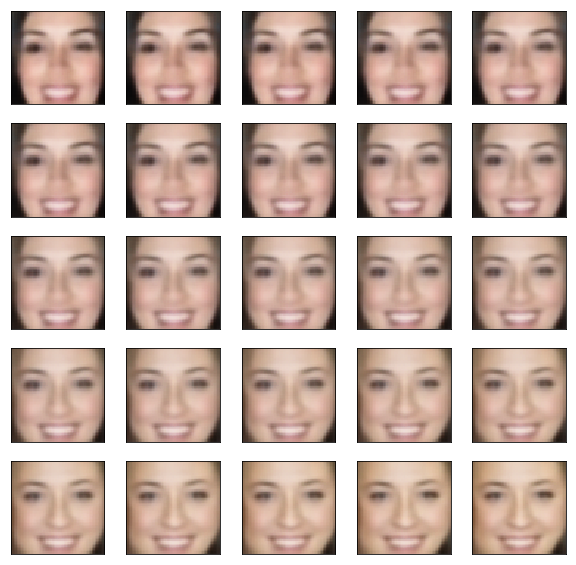

In [0]:
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(z_dec[i])

Переходы между изображениями плавные, нет эффекта наложения одного изображения на другое. Все потому, что у вариационного автоэнкодера латентное пространство непрерывное. Одному изображению соответствует некоторая окрестность в латентном пространстве, поэтому если взять очень близкие точки, то получим очень похожие реконструкции. В каждом ряду мы как будто смотрим на 5 одинаковых изображений.

### Рандомные вектора

а) сгенерировать рандомные латентные векторы (без энкодера, например, с помощью np.random.randn), скормить их decoder'у и посмотреть, что получится. То есть, вы сможете создавать новые лица людей из векторов

Сгенерируем батч из рандомных векторов

In [0]:
noise = np.random.rand(batch_size, vae.latent_dim)

Пропустим через декодер

In [0]:
dec_imgs = vae.decoder.predict(noise)

Посмотрим на результат

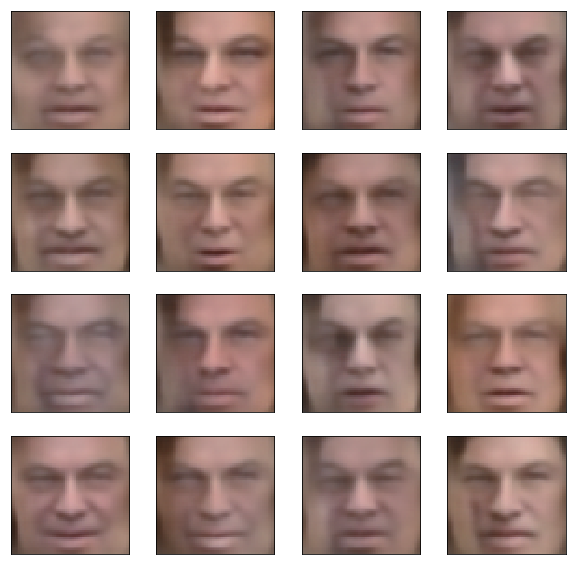

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(dec_imgs[i])

Если брать совсем произвольные вектора, то результат, конечно, лучше, чем у обычного автоэнкодера, но не радует разнообразием.

Теперь сгенерируем батч из рандомных нормальных векторов

In [0]:
noise = np.random.randn(batch_size, vae.latent_dim)

Пропустим через декодер

In [0]:
dec_imgs = vae.decoder.predict(noise)

Посмотрим на результат

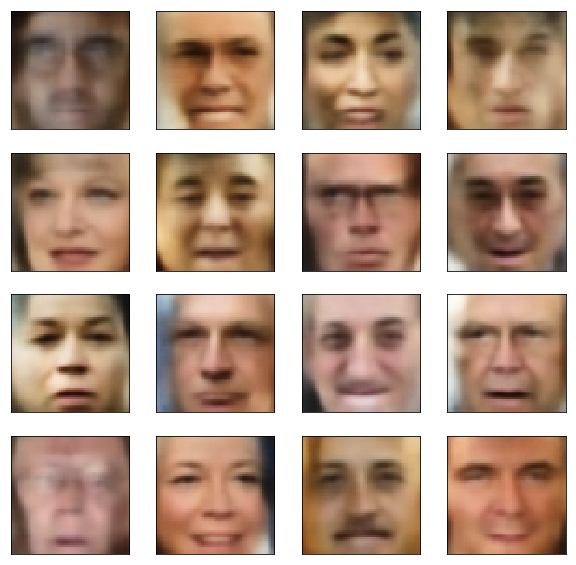

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(dec_imgs[i])

Для произвольных нормальных векторов получаем разнообразные лица, как мы и хотели

### Улыбка

б) Второе, что предлагается сделать -- научить лепить улыбки на лица грустных людей.

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear">

План такой:

1) Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15 сойдет) людей с улыбками и столько же без

2) Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3) Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

3) А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного чувака и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии)

Информацию о грустных и улыбающихся людях получим из файла *lfw_attributes.txt*

In [0]:
import pandas as pd

In [0]:
attr = pd.read_csv('/content/lfw_attributes.txt', sep='\t', skiprows=1)

In [0]:
attr.head()

,#,person,imagenum,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,Blond Hair,Brown Hair,Bald,No Eyewear,Eyeglasses,Sunglasses,Mustache,Smiling,Frowning,Chubby,Blurry,Harsh Lighting,Flash,Soft Lighting,Outdoor,Curly Hair,Wavy Hair,Straight Hair,Receding Hairline,Bangs,Sideburns,Fully Visible Forehead,Partially Visible Forehead,Obstructed Forehead,Bushy Eyebrows,Arched Eyebrows,Narrow Eyes,Eyes Open,Big Nose,Pointy Nose,Big Lips,Mouth Closed,Mouth Slightly Open,Mouth Wide Open,Teeth Not Visible,No Beard,Goatee,Round Jaw,Double Chin,Wearing Hat,Oval Face,Square Face,Round Face,Color Photo,Posed Photo,Attractive Man,Attractive Woman,Indian,Gray Hair,Bags Under Eyes,Heavy Makeup,Rosy Cheeks,Shiny Skin,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,Aaron Eckhart,1,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.195580,-0.835609,-0.351468,-1.012533,-0.719593,-0.632401,0.464839,-0.973528,1.565186,-1.296704,-1.542719,-0.684671,-0.864990,0.766886,-0.218952,-1.655665,-0.787044,-0.599665,0.458519,0.189760,0.851555,-0.385720,-0.497719,-0.161149,-0.257514,-0.088839,0.455469,-0.839211,-0.022948,-0.922568,-0.114539,1.461222,1.758481,0.068894,1.267860,-1.120244,0.917617,-1.307957,-1.500413,1.029221,0.832363,-0.498657,0.251365,-0.705281,-0.515715,0.374239,-0.168675,-0.614143,3.097703,1.523858,0.779278,-0.071454,-1.246483,-0.769283,-0.725597,-1.820610,-2.072977,-0.960759,0.361738,1.166118,-1.164916,-1.139990,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609,NaN
1,Aaron Guiel,1,0.169851,-0.982408,0.422709,-1.282184,-1.360060,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,-0.736883,0.294554,-1.277647,0.954771,-0.990992,-1.167359,-0.835146,0.798544,-0.971679,0.342826,-1.322562,0.962937,-1.199363,-0.157307,0.443224,-0.002882,-0.021158,-0.226563,-0.081039,-0.827202,-0.106624,1.227594,-0.812223,-1.241258,0.096272,-0.404544,0.325919,0.474452,1.135359,0.058725,0.611176,-1.172510,0.428512,-0.874235,-1.191565,0.192359,-0.204166,0.342347,0.239512,-1.474690,0.236057,-0.565208,-0.712542,2.997076,-0.273306,-0.187722,-0.604608,-1.321701,-0.938559,0.494294,-0.659043,-1.143747,-0.775722,-0.832036,-0.397680,0.874160,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.666760,-0.496559,NaN
2,Aaron Patterson,1,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,-1.200725,-0.332460,-0.537006,1.298364,-1.498471,-1.285823,1.141742,0.172817,0.106412,-0.788843,0.349295,-1.643716,0.454287,1.189458,-0.688414,-0.590574,-0.266673,0.467224,0.567348,-1.719101,0.124667,1.602741,-0.659399,-1.753762,1.204473,0.022188,-1.135443,1.702857,-0.422144,0.587859,0.414363,0.344447,-1.260451,-0.577746,0.405567,-1.916545,0.921260,0.247437,-0.428451,-0.772273,0.370673,-0.509596,-0.768482,1.706897,0.126524,-0.497001,-0.393042,-0.178307,-1.180227,-0.596914,-1.805382,-0.951643,-0.838087,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231,NaN
3,Aaron Peirsol,1,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,-0.070519,-0.339239,-2.004149,0.665695,-0.775940,-1.471629,-1.179080,0.563327,-0.664429,-1.407928,0.435594,-0.589988,-1.603498,1.170741,0.760103,0.211498,-0.516180,-1.331146,0.202840,0.149645,-0.046430,0.640885,-0.107616,-0.831271,-0.827005,-0.588725,0.429255,1.587664,0.499086,-0.056869,-0.866643,-0.959689,0.350730,-1.335354,-0.427890,0.826817,-0.256779,0.149751,-1.201531,-1.083917,0.255363,-0.650423,-0.506293,1.101592,0.640783,1.575028,-0.484397,-1.559682,-1.437124,0.379363,-0.648233,-2.257352,-1.075613,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025,NaN
4,Aaron Peirsol,2,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,-0.568057,0.840375,-1.981269,1.666710,-0.910723,-1.993509,-0.871335,0.507786,-0.488947,-0.886490

Заголовки колонок сдвинуты, исправим это

In [0]:
columns = attr.columns[1:]

In [0]:
attr = attr.iloc[:, :-1]

In [0]:
attr.columns = columns

In [0]:
attr.head()

,person,imagenum,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,Blond Hair,Brown Hair,Bald,No Eyewear,Eyeglasses,Sunglasses,Mustache,Smiling,Frowning,Chubby,Blurry,Harsh Lighting,Flash,Soft Lighting,Outdoor,Curly Hair,Wavy Hair,Straight Hair,Receding Hairline,Bangs,Sideburns,Fully Visible Forehead,Partially Visible Forehead,Obstructed Forehead,Bushy Eyebrows,Arched Eyebrows,Narrow Eyes,Eyes Open,Big Nose,Pointy Nose,Big Lips,Mouth Closed,Mouth Slightly Open,Mouth Wide Open,Teeth Not Visible,No Beard,Goatee,Round Jaw,Double Chin,Wearing Hat,Oval Face,Square Face,Round Face,Color Photo,Posed Photo,Attractive Man,Attractive Woman,Indian,Gray Hair,Bags Under Eyes,Heavy Makeup,Rosy Cheeks,Shiny Skin,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,Aaron Eckhart,1,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.195580,-0.835609,-0.351468,-1.012533,-0.719593,-0.632401,0.464839,-0.973528,1.565186,-1.296704,-1.542719,-0.684671,-0.864990,0.766886,-0.218952,-1.655665,-0.787044,-0.599665,0.458519,0.189760,0.851555,-0.385720,-0.497719,-0.161149,-0.257514,-0.088839,0.455469,-0.839211,-0.022948,-0.922568,-0.114539,1.461222,1.758481,0.068894,1.267860,-1.120244,0.917617,-1.307957,-1.500413,1.029221,0.832363,-0.498657,0.251365,-0.705281,-0.515715,0.374239,-0.168675,-0.614143,3.097703,1.523858,0.779278,-0.071454,-1.246483,-0.769283,-0.725597,-1.820610,-2.072977,-0.960759,0.361738,1.166118,-1.164916,-1.139990,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609
1,Aaron Guiel,1,0.169851,-0.982408,0.422709,-1.282184,-1.360060,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,-0.736883,0.294554,-1.277647,0.954771,-0.990992,-1.167359,-0.835146,0.798544,-0.971679,0.342826,-1.322562,0.962937,-1.199363,-0.157307,0.443224,-0.002882,-0.021158,-0.226563,-0.081039,-0.827202,-0.106624,1.227594,-0.812223,-1.241258,0.096272,-0.404544,0.325919,0.474452,1.135359,0.058725,0.611176,-1.172510,0.428512,-0.874235,-1.191565,0.192359,-0.204166,0.342347,0.239512,-1.474690,0.236057,-0.565208,-0.712542,2.997076,-0.273306,-0.187722,-0.604608,-1.321701,-0.938559,0.494294,-0.659043,-1.143747,-0.775722,-0.832036,-0.397680,0.874160,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.666760,-0.496559
2,Aaron Patterson,1,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,-1.200725,-0.332460,-0.537006,1.298364,-1.498471,-1.285823,1.141742,0.172817,0.106412,-0.788843,0.349295,-1.643716,0.454287,1.189458,-0.688414,-0.590574,-0.266673,0.467224,0.567348,-1.719101,0.124667,1.602741,-0.659399,-1.753762,1.204473,0.022188,-1.135443,1.702857,-0.422144,0.587859,0.414363,0.344447,-1.260451,-0.577746,0.405567,-1.916545,0.921260,0.247437,-0.428451,-0.772273,0.370673,-0.509596,-0.768482,1.706897,0.126524,-0.497001,-0.393042,-0.178307,-1.180227,-0.596914,-1.805382,-0.951643,-0.838087,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231
3,Aaron Peirsol,1,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,-0.070519,-0.339239,-2.004149,0.665695,-0.775940,-1.471629,-1.179080,0.563327,-0.664429,-1.407928,0.435594,-0.589988,-1.603498,1.170741,0.760103,0.211498,-0.516180,-1.331146,0.202840,0.149645,-0.046430,0.640885,-0.107616,-0.831271,-0.827005,-0.588725,0.429255,1.587664,0.499086,-0.056869,-0.866643,-0.959689,0.350730,-1.335354,-0.427890,0.826817,-0.256779,0.149751,-1.201531,-1.083917,0.255363,-0.650423,-0.506293,1.101592,0.640783,1.575028,-0.484397,-1.559682,-1.437124,0.379363,-0.648233,-2.257352,-1.075613,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,Aaron Peirsol,2,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,-0.568057,0.840375,-1.981269,1.666710,-0.910723,-1.993509,-0.871335,0.507786,-0.488947,-0.886490,-0.990132,-0.7508

Найдем имя колонки, отвечающей за улыбку

In [0]:
attr.columns

Index(['person', 'imagenum', 'Male', 'Asian', 'White', 'Black', 'Baby',
       'Child', 'Youth', 'Middle Aged', 'Senior', 'Black Hair', 'Blond Hair',
       'Brown Hair', 'Bald', 'No Eyewear', 'Eyeglasses', 'Sunglasses',
       'Mustache', 'Smiling', 'Frowning', 'Chubby', 'Blurry', 'Harsh Lighting',
       'Flash', 'Soft Lighting', 'Outdoor', 'Curly Hair', 'Wavy Hair',
       'Straight Hair', 'Receding Hairline', 'Bangs', 'Sideburns',
       'Fully Visible Forehead', 'Partially Visible Forehead',
       'Obstructed Forehead', 'Bushy Eyebrows', 'Arched Eyebrows',
       'Narrow Eyes', 'Eyes Open', 'Big Nose', 'Pointy Nose', 'Big Lips',
       'Mouth Closed', 'Mouth Slightly Open', 'Mouth Wide Open',
       'Teeth Not Visible', 'No Beard', 'Goatee', 'Round Jaw', 'Double Chin',
       'Wearing Hat', 'Oval Face', 'Square Face', 'Round Face', 'Color Photo',
       'Posed Photo', 'Attractive Man', 'Attractive Woman', 'Indian',
       'Gray Hair', 'Bags Under Eyes', 'Heavy Makeup', 'Rosy Chee

И отсортируем по ней табличку из файла

In [0]:
sort_attr = attr.sort_values(by='Smiling')

Отберем 16 самых улыбающихся

In [0]:
smiling = sort_attr.iloc[-16:, [0, 1, 19]]

In [0]:
smiling

,person,imagenum,Smiling
983,Ashlea Talbot,1,2.610540
682,Anita DeFrantz,1,2.639694
6166,Jennifer Renee Short,1,2.651704
459,Amelia Vega,4,2.659124
9004,Michelle Rodriguez,1,2.664156
1955,Cheryl James,1,2.669922
2031,Christina Sawaya,1,2.670851
1359,Blythe Hartley,1,2.677178
11797,Susie Castillo,2,2.683156
6139,Jennifer Lopez,1,2.716630


Сформируем из них батч для подачи нашей модели (не забываем про resize и нормировку, а также центральный кроп)

In [0]:
dir = '/content/lfw-deepfunneled/'
smiling_batch = []
for i in range(16):
  person = smiling['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = smiling['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  smiling_batch.append(x)

In [0]:
smiling_batch = np.array(smiling_batch)

Посмотрим на этих улыбающихся людей

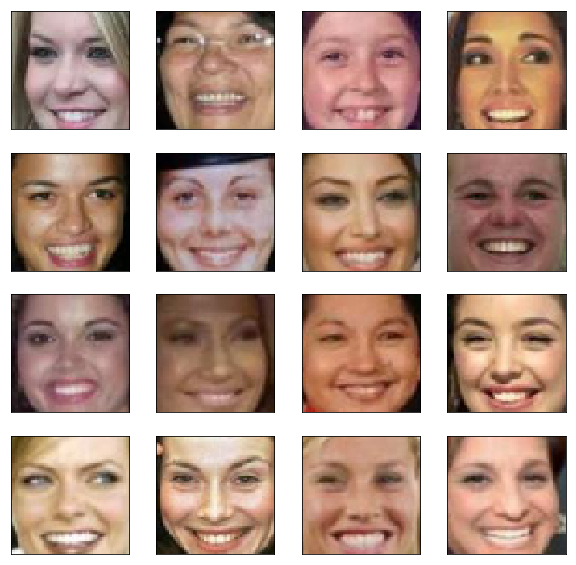

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(smiling_batch[i])

In [0]:
smiling_batch.shape

(16, 64, 64, 3)

In [0]:
smiling_latent = vae.encoder.predict(smiling_batch)

In [0]:
smiling_latent.shape

(16, 768)

Вычислим средний латентный вектор улыбающихся людей

In [0]:
smiling_mean = smiling_latent.mean(axis=0)

In [0]:
smiling_mean.shape

(768,)

Проделаем то же самое для грустных людей

In [0]:
sad = sort_attr.iloc[:16, [0, 1, 19]]

In [0]:
sad

,person,imagenum,Smiling
11571,Sohail Abbas,1,-2.686594
1234,Bill Elliott,1,-2.664484
7506,Kimi Raikkonen,3,-2.643547
5458,Irina Framtsova,1,-2.639749
7065,Juan Ignacio Chela,1,-2.630769
11912,Taufik Hidayat,1,-2.589319
1654,Carlo Ancelotti,3,-2.589131
471,Amelie Mauresmo,9,-2.555868
8410,Maria Shkolnikova,1,-2.542728
8596,Martin McGuinness,2,-2.541024


In [0]:
dir = '/content/lfw-deepfunneled/'
sad_batch = []
for i in range(16):
  person = sad['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = sad['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  sad_batch.append(x)

In [0]:
sad_batch = np.array(sad_batch)

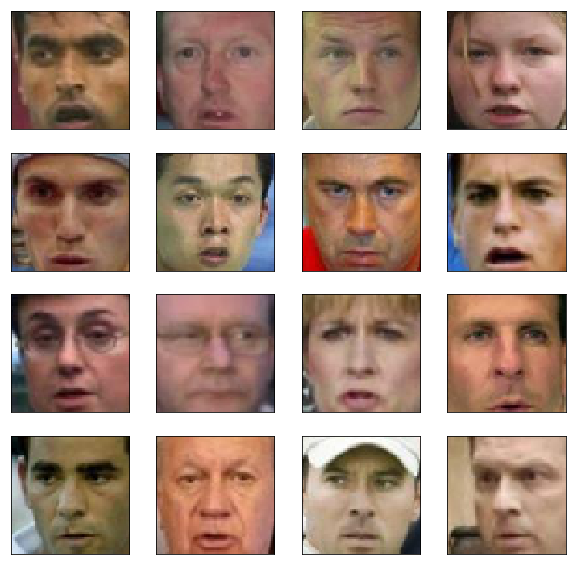

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_batch[i])

In [0]:
sad_batch.shape

(16, 64, 64, 3)

In [0]:
sad_latent = vae.encoder.predict(sad_batch)

In [0]:
sad_latent.shape

(16, 768)

In [0]:
sad_mean = sad_latent.mean(axis=0)

In [0]:
sad_mean.shape

(768,)

Вычислим вектор улыбки

In [0]:
SMILE = smiling_mean - sad_mean

Добавим улыбку грустным людям

In [0]:
sad_plus_smile_latent = sad_latent + SMILE

In [0]:
sad_plus_smile_latent = sad_plus_smile_latent.reshape((-1, vae.latent_dim))

In [0]:
sad_plus_smile = vae.decoder.predict(sad_plus_smile_latent)

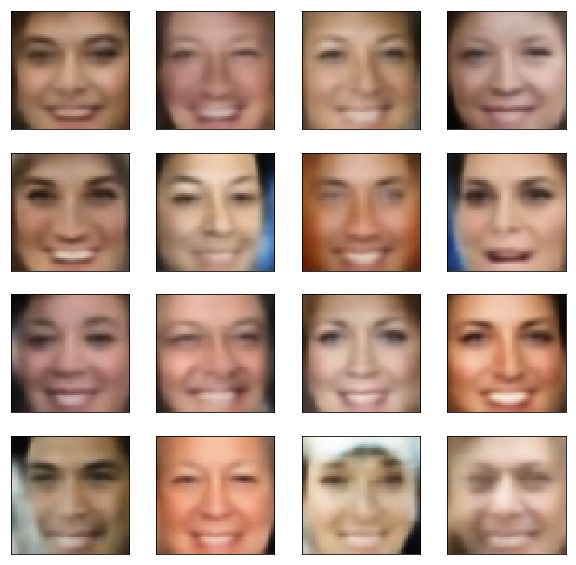

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_plus_smile[i])

Улыбки смотрятся очень органично (не наложены поверх изображения как у обычного автоэнкодера), правда сами люди не очень на себя похожи (но это скорее из-за слабоватой реконструкции моего vae)

Из любопытства посмотрим, что возвращает декодер по средним векторам и вектору улыбки

Так выглядит средний улыбающийся человек

In [0]:
dec_smiling_mean = vae.decoder.predict(smiling_mean.reshape(-1, vae.latent_dim))

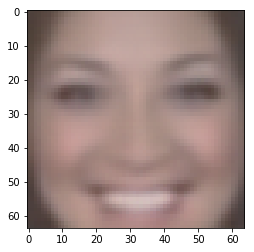

In [0]:
plt.imshow(dec_smiling_mean[0])

Так средний грустный

In [0]:
dec_sad_mean = vae.decoder.predict(sad_mean.reshape(-1, vae.latent_dim))

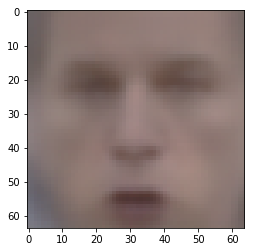

In [0]:
plt.imshow(dec_sad_mean[0])

Это разность между декодированными средними

W0627 20:08:33.151113 140059176904576 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


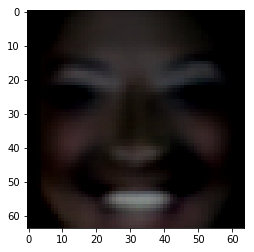

In [0]:
plt.imshow(dec_smiling_mean[0] - dec_sad_mean[0])

А это декодированная разность (декодированный латентный вектор улыбки без добавления лица)

In [0]:
dec_SMILE = vae.decoder.predict(SMILE.reshape(-1, vae.latent_dim))

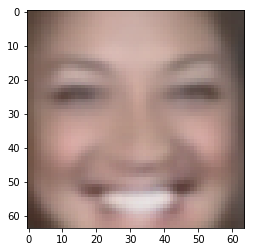

In [0]:
plt.imshow(dec_SMILE[0])

Из вектора улыбки получается полноценный человек.

#### Женская улыбка

Проделаем то же самое, но только для женщин (для сравнения с ae)

In [0]:
sort_attr = attr[attr['Male'] < -0.5].sort_values(by='Smiling')

Улыбающиеся женщины

In [0]:
smiling = sort_attr.iloc[-16:, [0, 1, 19]]

In [0]:
dir = '/content/lfw-deepfunneled/'
smiling_batch = []
for i in range(16):
  person = smiling['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = smiling['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  smiling_batch.append(x)

In [0]:
smiling_batch = np.array(smiling_batch)

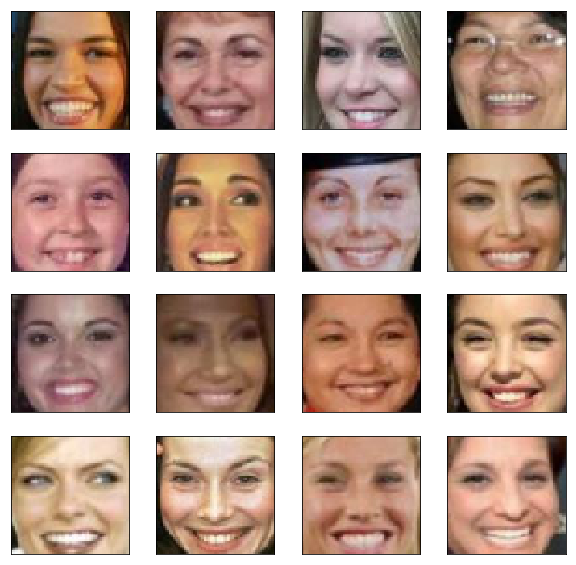

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(smiling_batch[i])

In [0]:
smiling_latent = vae.encoder.predict(smiling_batch)

In [0]:
smiling_mean = smiling_latent.mean(axis=0)

Грустные женщины

In [0]:
sad = sort_attr.iloc[:16, [0, 1, 19]]

In [0]:
dir = '/content/lfw-deepfunneled/'
sad_batch = []
for i in range(16):
  person = sad['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = sad['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  sad_batch.append(x)

In [0]:
sad_batch = np.array(sad_batch)

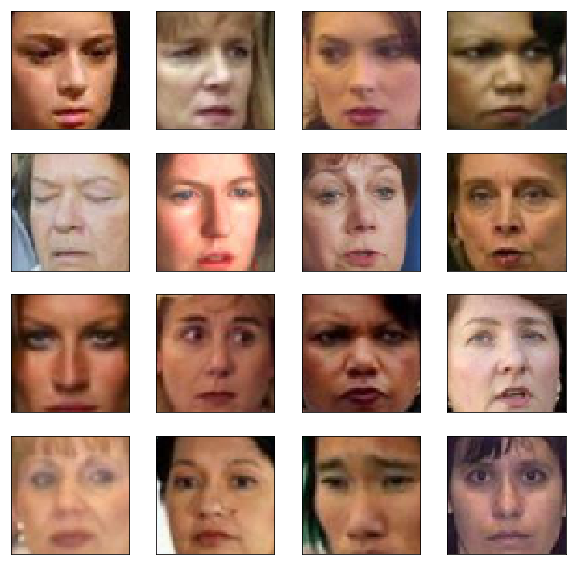

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_batch[i])

In [0]:
sad_latent = vae.encoder.predict(sad_batch)

In [0]:
sad_mean = sad_latent.mean(axis=0)

Добавление улыбки

In [0]:
SMILE = smiling_mean - sad_mean

In [0]:
sad_plus_smile_latent = sad_latent + SMILE

In [0]:
sad_plus_smile_latent = sad_plus_smile_latent.reshape((-1, vae.latent_dim))

In [0]:
sad_plus_smile = vae.decoder.predict(sad_plus_smile_latent)

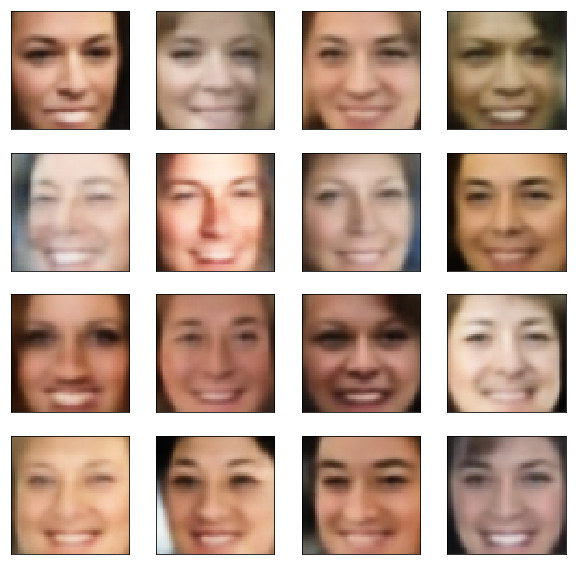

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_plus_smile[i])

Улыбки смотрятся отлично)

Так теперь выглядит средний улыбающийся человек

In [0]:
dec_smiling_mean = vae.decoder.predict(smiling_mean.reshape(-1, vae.latent_dim))

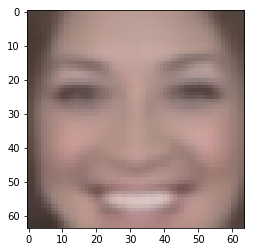

In [0]:
plt.imshow(dec_smiling_mean[0])

Так средний грустный

In [0]:
dec_sad_mean = vae.decoder.predict(sad_mean.reshape(-1, vae.latent_dim))

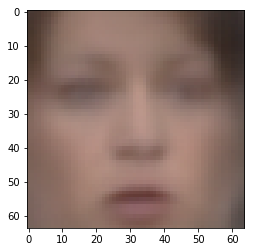

In [0]:
plt.imshow(dec_sad_mean[0])

Это разность между декодированными средними

W0627 20:15:20.308996 140059176904576 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


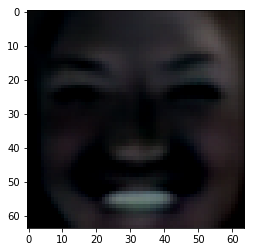

In [0]:
plt.imshow(dec_smiling_mean[0] - dec_sad_mean[0])

А это декодированная разность (декодированный латентный вектор улыбки без добавления лица)

In [0]:
dec_SMILE = vae.decoder.predict(SMILE.reshape(-1, vae.latent_dim))

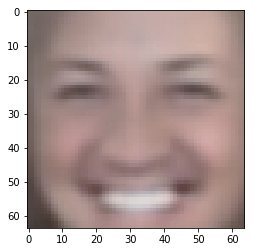

In [0]:
plt.imshow(dec_SMILE[0])